In [1]:
#import libs
import numpy as np
import pandas
import matplotlib.pyplot as plt
import csv
from tqdm import tqdm_notebook as tqdm
import os
#!!! if lib is not installed call "!pip install <libname>" in jupyter

In [2]:
#import libs
# Python 2 and 3 compatibility
# pip install future
from __future__ import (absolute_import, division,
                        print_function, unicode_literals)
# отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')

# будем отображать графики прямо в jupyter'e
%pylab inline

#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
import seaborn as sns

#!!! if lib is not installed call "!pip install <libname>" in jupyter

Populating the interactive namespace from numpy and matplotlib


In [3]:
#copy from here
labels = {'TRN_CNT_AVIA','TRN_CNT_ASRV','TRN_CNT_APTK','TRN_CNT_AURT','TRN_CNT_GSRV','TRN_CNT_DOMS','TRN_CNT_OTHR',
'TRN_CNT_ZHDT','TRN_CNT_ZOOS','TRN_CNT_GAME','TRN_CNT_ARTS','TRN_CNT_KCSH','TRN_CNT_KINO','TRN_CNT_BOOK','TRN_CNT_CMSV',
'TRN_CNT_BEAU','TRN_CNT_MEDC','TRN_CNT_MUSC','TRN_CNT_EDUC','TRN_CNT_CLTH','TRN_CNT_HOTL','TRN_CNT_ENTR','TRN_CNT_RSTR',
'TRN_CNT_SPRT','TRN_CNT_SUPM','TRN_CNT_TELE','TRN_CNT_FUEL','TRN_CNT_TRAN','TRN_CNT_FLOW','TRN_CNT_JEWL','TRN_CNT_DUTF',
'TRN_AMNT_AVIA','TRN_AMNT_ASRV','TRN_AMNT_APTK','TRN_AMNT_AURT','TRN_AMNT_GSRV','TRN_AMNT_DOMS','TRN_AMNT_OTHR',
'TRN_AMNT_ZHDT','TRN_AMNT_ZOOS','TRN_AMNT_GAME','TRN_AMNT_ARTS','TRN_AMNT_KCSH','TRN_AMNT_KINO','TRN_AMNT_BOOK',
'TRN_AMNT_CMSV','TRN_AMNT_BEAU','TRN_AMNT_MEDC','TRN_AMNT_MUSC','TRN_AMNT_EDUC','TRN_AMNT_CLTH','TRN_AMNT_HOTL',
'TRN_AMNT_ENTR','TRN_AMNT_RSTR','TRN_AMNT_SPRT','TRN_AMNT_SUPM','TRN_AMNT_TELE','TRN_AMNT_FUEL','TRN_AMNT_TRAN',
'TRN_AMNT_FLOW','TRN_AMNT_JEWL','TRN_AMNT_DUTF',
'DBO_PAY_CNT_MOBL','DBO_PAY_CNT_ZHKH','DBO_PAY_CNT_COMS','DBO_PAY_CNT_EDUC','DBO_PAY_CNT_WALT','DBO_PAY_CNT_CREDS',
'DBO_PAY_CNT_GOSP','DBO_PAY_CNT_INSH','DBO_PAY_CNT_MLM','DBO_PAY_CNT_OTHR',
'DBO_PAY_AMNT_MOBL','DBO_PAY_AMNT_ZHKH','DBO_PAY_AMNT_COMS','DBO_PAY_AMNT_EDUC','DBO_PAY_AMNT_WALT','DBO_PAY_AMNT_CREDS',
'DBO_PAY_AMNT_GOSP','DBO_PAY_AMNT_INSH','DBO_PAY_AMNT_MLM','DBO_PAY_AMNT_OTHR'
}

In [4]:
dfheat = pandas.read_csv('t1.csv',sep=";|,", engine="python")
dfclients = pandas.read_csv('t4.csv',sep=";|,", engine="python",encoding="utf-8")

#next line because 'CLIENT_HASH_ID' in dfheat is surrounded with double quotes, but in dfclients it does not
dfclients['CLIENT_HASH_ID']='"' + dfclients['CLIENT_HASH_ID'] + '"'

dfheat['GENDER'] = dfheat.CLIENT_HASH_ID.map(dfclients.set_index('CLIENT_HASH_ID')['GENDER'].to_dict())
dfheat['F1'] = dfheat.CLIENT_HASH_ID.map(dfclients.set_index('CLIENT_HASH_ID')['F1'].to_dict())
dfheat['AGE'] = dfheat.CLIENT_HASH_ID.map(dfclients.set_index('CLIENT_HASH_ID')['AGE'].to_dict())

In [ ]:
dfheat = dfheat.loc[dfheat['ACTIVE_FLAG']==1]

In [ ]:
for month in unique(dfheat['REPORT_MONTH']):
    d = dfheat.loc[dfheat['REPORT_MONTH']==month]
    d.to_csv(os.getcwd()+"\\CSV\\"+month.strip('"').split(' ')[0]+"Active.csv")

In [8]:
#############################
for month in unique(dfheat['REPORT_MONTH']):
    d = dfheat.loc[dfheat['REPORT_MONTH']==month]
    d.to_csv(os.getcwd()+"\\CSV\\All\\"+month.strip('"').split(' ')[0]+".csv")
#############################

In [6]:
months = ['"2015-01-01 00:00:00"', '"2015-02-01 00:00:00"',
       '"2015-03-01 00:00:00"', '"2015-04-01 00:00:00"',
       '"2015-05-01 00:00:00"', '"2015-06-01 00:00:00"',
       '"2015-07-01 00:00:00"', '"2015-08-01 00:00:00"',
       '"2015-09-01 00:00:00"', '"2015-10-01 00:00:00"',
       '"2015-11-01 00:00:00"', '"2015-12-01 00:00:00"',
       '"2016-01-01 00:00:00"', '"2016-02-01 00:00:00"',
       '"2016-03-01 00:00:00"', '"2016-04-01 00:00:00"',
       '"2016-05-01 00:00:00"', '"2016-06-01 00:00:00"',
       '"2016-07-01 00:00:00"']

In [7]:
marketing_classes = [nan, '018d34d8d97fe30fd4347602b8031ec4',
       '0e521f30657448f205ecf7a46e4105c0',
       '1254981c914a2f3b05de147071f7e9d9',
       '14aa590a6630a7dd9a4233b8b8182100',
       '1ca2d30ce0631cee23b98dfc2d24bdcf',
       '263c6b32daca30743034adbd1f68a5fc',
       '309e6b5acaa01d889ed303cf65a72dbe',
       '381b0b043094c8cf1fc0e5ecd17a4461',
       '385043f3881c79a5959ab4c3145f8aa8',
       '3c423cf4f2bdd61e4dc739b26d945709',
       '3dfbcfdf96da35c17688cd96b5a94578',
       '5213e792098c90e356b18861f64570af',
       '6ede6f872f8d56aa83876b96bcde60d4',
       '71e1e42d79887c04b571828357d5f37e',
       '7d33c54b3363042d090cb011b215279c',
       '8215444bab327ec0f170d0ef7296c026',
       '8df3acb67e47faaeb753cc9a4c6ced3e',
       '94a7532568244c10541472dffb66f1f1',
       '95f6593eafb80e2b9d138cbee39c89b0',
       '96ef29bcab993c1a6eff79d066cfe894',
       '974e283779718b032e7845eda467b157',
       '97fa64500457edb6fe17b0acdaf218b2',
       'a1fffaa77ff30165958613b698dc8fd5',
       'ac02849f665b4380fc99f9d0e335d076',
       'b628d7d2ba91a097a131c51788e8c4ea',
       'b871449af47f30db11ef29b52e39819d',
       'bac64815dc7b441809c1d4de833ef9fd',
       'db96a8c8cf0715541dd5d9fd96529ac4',
       'ea77621ec0b8418bfa7b81253ab7d321',
       'fe413a3ae1fa1e6e1b7508863bf7ad0d']

In [ ]:
for month in tqdm(months):
    dfheat = pandas.read_csv(os.getcwd()+"\\CSV\\"+ month.strip('"').split(' ')[0]+"Active.csv" ,sep=";|,", engine="python")
    dict={}
    for cat in tqdm(marketing_classes):
        dict[cat]={}
        for trtype in labels:
            dict[cat][trtype] = 0
            
    for index, row in tqdm(dfheat.iterrows()):
        for trtype in labels:
            dict[row['F1']][trtype] += row[trtype]
            
    df = pandas.DataFrame(columns=('type', 'F1', 'val'))
    for cat in tqdm(dict):
        for type in dict[cat]:
            df.loc[len(df)] = [type, cat, dict[cat][type]]
    df.to_csv(os.getcwd()+"\\CSV\\heatcsv\\"+month.strip('"').split(' ')[0]+"ActiveHeat.csv")   

In [11]:
########################
for month in tqdm(months):
    dfheat = pandas.read_csv(os.getcwd()+"\\CSV\\All\\All"+ month.strip('"').split(' ')[0]+".csv" ,sep=";|,", engine="python")
    dict={}
    for cat in tqdm(marketing_classes):
        dict[cat]={}
        for trtype in labels:
            dict[cat][trtype] = 0
            
    for index, row in tqdm(dfheat.iterrows()):
        for trtype in labels:
            dict[row['F1']][trtype] += row[trtype]
            
    df = pandas.DataFrame(columns=('type', 'F1', 'val'))
    for cat in tqdm(dict):
        for type in dict[cat]:
            df.loc[len(df)] = [type, cat, dict[cat][type]]
    df.to_csv(os.getcwd()+"\\CSV\\AllHeat\\"+month.strip('"').split(' ')[0]+"Heat.csv")  
########################

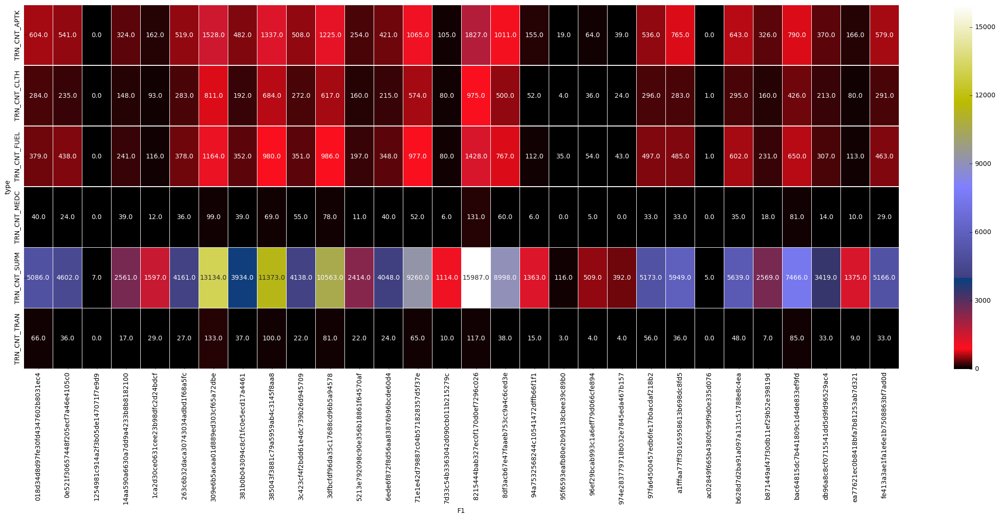

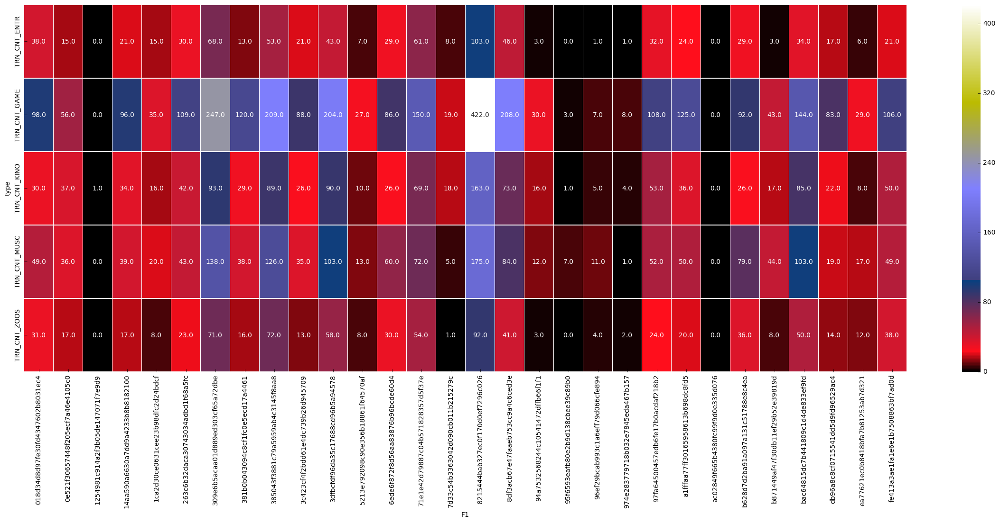

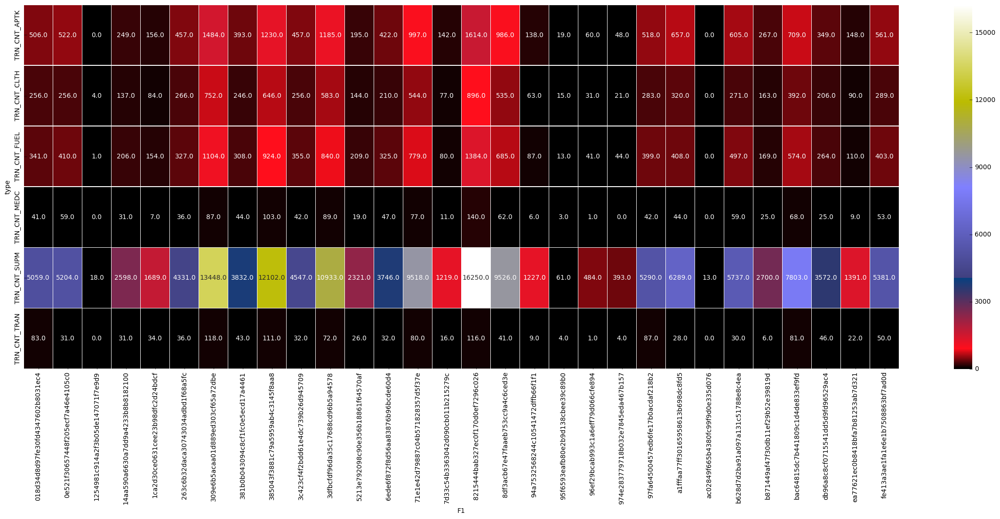

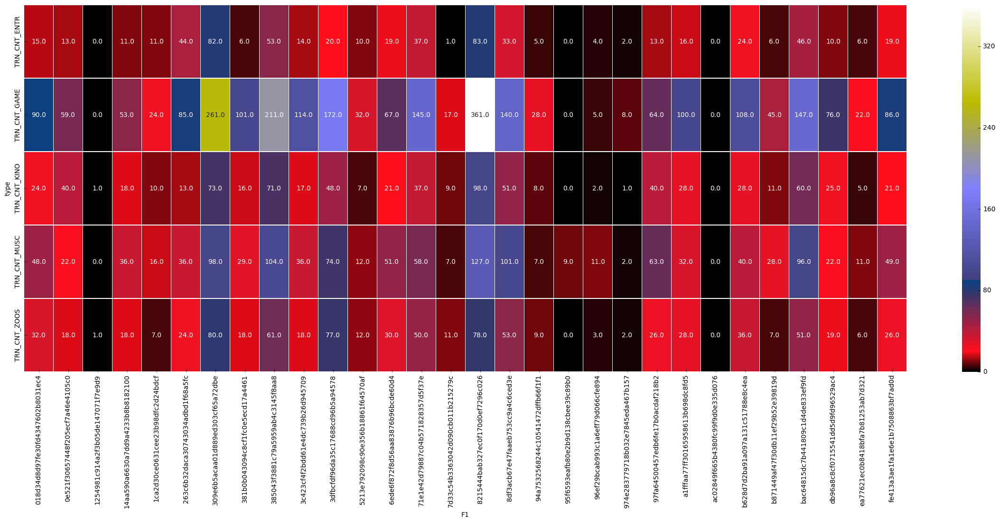

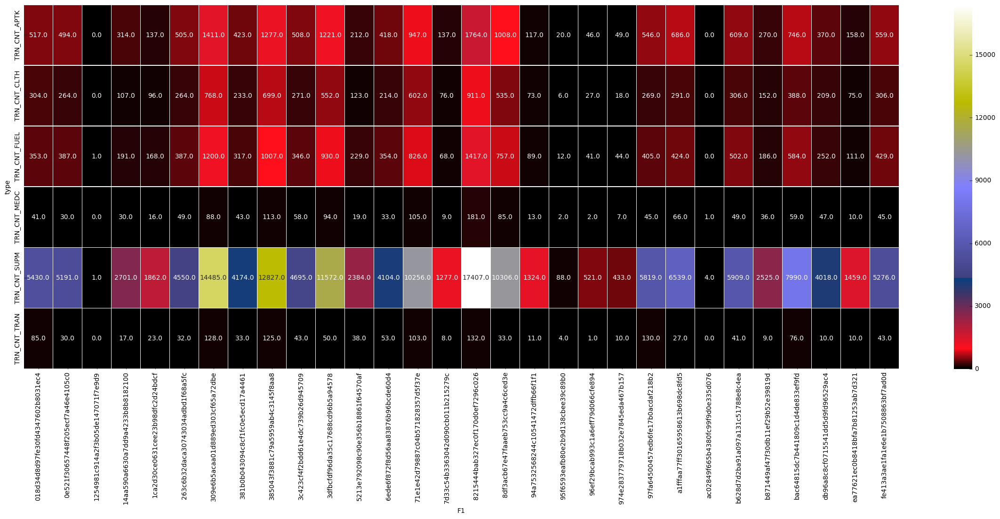

...

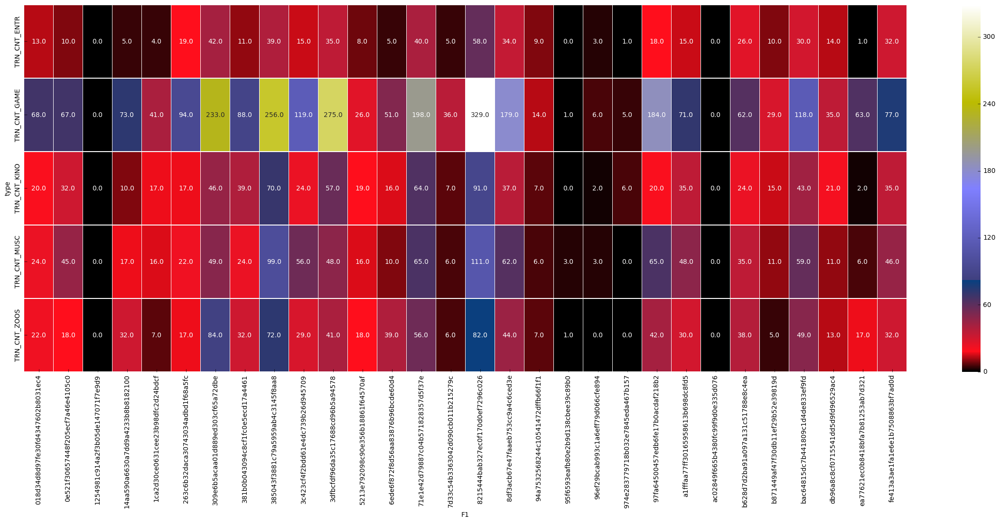

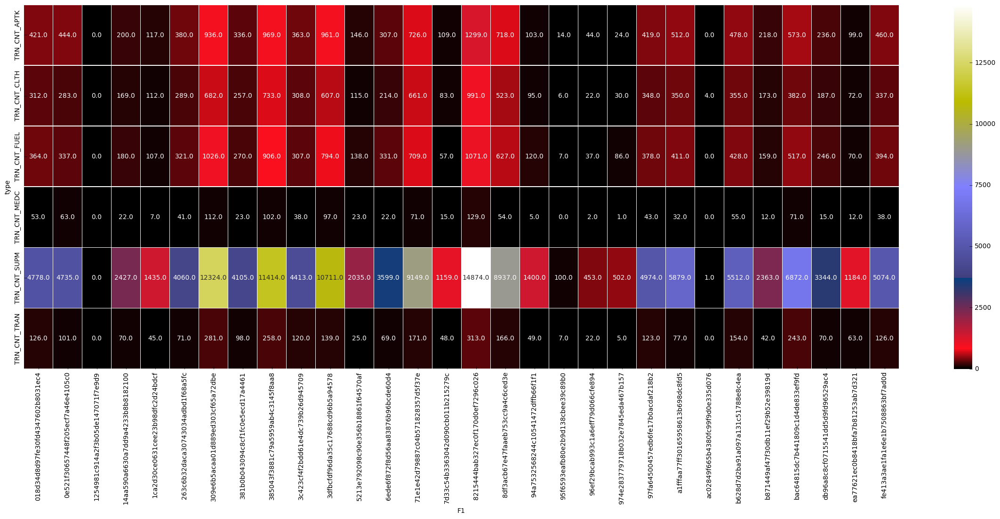

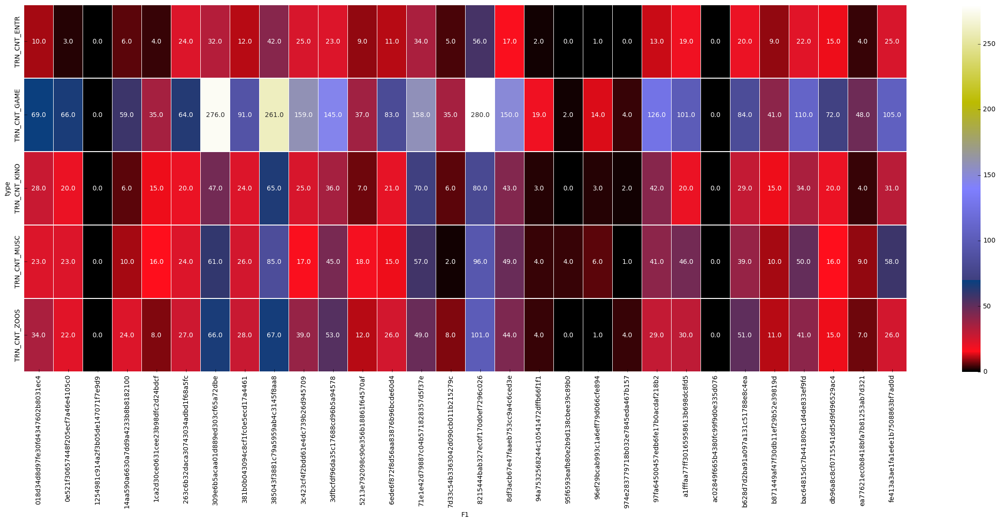

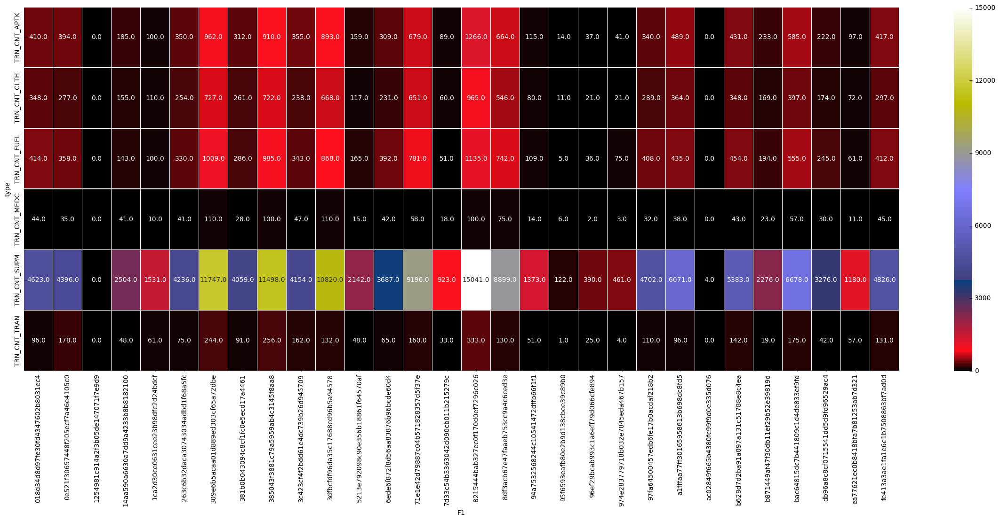

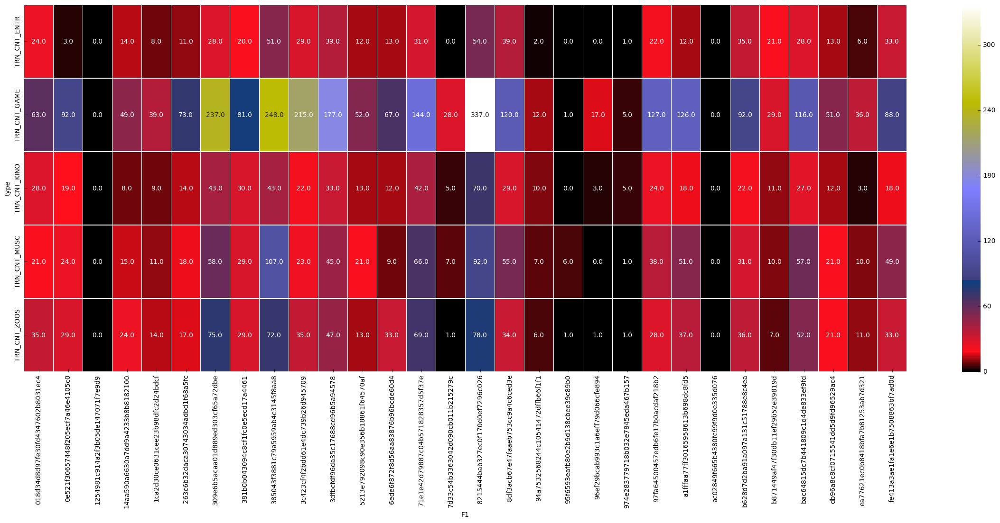

In [19]:
############################
for month in tqdm(months):
    df = pandas.read_csv(os.getcwd()+"\\CSV\\AllHeat\\"+month.strip('"').split(' ')[0]+"Heat.csv")
    ############################
    #print TRN_CNT heatmap
    #selected columns
    coltest = ['TRN_CNT_APTK', 'TRN_CNT_CLTH', 'TRN_CNT_FUEL','TRN_CNT_MEDC', 'TRN_CNT_SUPM', 'TRN_CNT_TRAN']
    #dftest is a part of dataset created above
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest):
            dftest.loc[len(dftest)] = row
            continue
            
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(30,10)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern")
    fig.savefig(os.getcwd()+"\\Maps\\Pervich\\"+month.strip('"').split(' ')[0]+".png")
    ############################
    #print TRN_AMN heatmap
    #selected columns
    coltest = ['TRN_CNT_ENTR', 'TRN_CNT_MUSC', 'TRN_CNT_GAME', 'TRN_CNT_KINO', 'TRN_CNT_ZOOS']
    #dftest is a part of dataset created above
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest):
            dftest.loc[len(dftest)] = row
            continue
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(30,10)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern")
    fig.savefig(os.getcwd()+"\\Maps\\Razvlech\\"+month.strip('"').split(' ')[0]+'.png')
    ############################
############################

In [ ]:
for month in tqdm(months):
    df = pandas.read_csv(os.getcwd()+"\\CSV\\heatcsv\\"+month.strip('"').split(' ')[0]+"ActiveHeat.csv")
    ############################
    #print TRN_CNT heatmap
    #selected columns
    coltest = ['TRN_CNT_AVIA','TRN_CNT_ASRV','TRN_CNT_APTK','TRN_CNT_AURT','TRN_CNT_GSRV','TRN_CNT_DOMS','TRN_CNT_OTHR',
    'TRN_CNT_ZHDT','TRN_CNT_ZOOS','TRN_CNT_GAME','TRN_CNT_ARTS','TRN_CNT_KCSH','TRN_CNT_KINO','TRN_CNT_BOOK','TRN_CNT_CMSV',
    'TRN_CNT_BEAU','TRN_CNT_MEDC','TRN_CNT_MUSC','TRN_CNT_EDUC','TRN_CNT_CLTH','TRN_CNT_HOTL','TRN_CNT_ENTR','TRN_CNT_RSTR',
    'TRN_CNT_SPRT','TRN_CNT_SUPM','TRN_CNT_TELE','TRN_CNT_FUEL','TRN_CNT_TRAN','TRN_CNT_FLOW','TRN_CNT_JEWL','TRN_CNT_DUTF'
    ]
    #dftest is a part of dataset created above
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest):
            dftest.loc[len(dftest)] = row
            continue
            
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(40,40)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern",vmax=17000,vmin=0)
    fig.savefig(os.getcwd()+"\\Maps\\TRN_CNT_FIXED\\"+month.strip('"').split(' ')[0]+"_TRN_CNT.png")
    ############################
    #print TRN_AMN heatmap
    #selected columns
    coltest = ['TRN_AMNT_AVIA','TRN_AMNT_ASRV','TRN_AMNT_APTK','TRN_AMNT_AURT','TRN_AMNT_GSRV','TRN_AMNT_DOMS','TRN_AMNT_OTHR',
    'TRN_AMNT_ZHDT','TRN_AMNT_ZOOS','TRN_AMNT_GAME','TRN_AMNT_ARTS','TRN_AMNT_KCSH','TRN_AMNT_KINO','TRN_AMNT_BOOK',
    'TRN_AMNT_CMSV','TRN_AMNT_BEAU','TRN_AMNT_MEDC','TRN_AMNT_MUSC','TRN_AMNT_EDUC','TRN_AMNT_CLTH','TRN_AMNT_HOTL',
    'TRN_AMNT_ENTR','TRN_AMNT_RSTR','TRN_AMNT_SPRT','TRN_AMNT_SUPM','TRN_AMNT_TELE','TRN_AMNT_FUEL','TRN_AMNT_TRAN',
    'TRN_AMNT_FLOW','TRN_AMNT_JEWL','TRN_AMNT_DUTF'
    ]
    #dftest is a part of dataset created above
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest):
            dftest.loc[len(dftest)] = row
            continue
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(50,40)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern",vmax=80000000,vmin=0)
    fig.savefig(os.getcwd()+"\\Maps\\TRN_AMNT_FIXED\\"+month.strip('"').split(' ')[0]+'_TRN_AMNT.png')
    ############################
    #print DBO_CNT heatmap
    #selected columns
    coltest = ['DBO_PAY_CNT_MOBL','DBO_PAY_CNT_ZHKH','DBO_PAY_CNT_COMS','DBO_PAY_CNT_EDUC','DBO_PAY_CNT_WALT','DBO_PAY_CNT_CREDS',
    'DBO_PAY_CNT_GOSP','DBO_PAY_CNT_INSH','DBO_PAY_CNT_MLM','DBO_PAY_CNT_OTHR',
    ]
    #dftest is a part of dataset created above
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest):
            dftest.loc[len(dftest)] = row
            continue
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(40,30)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern",vmax=1300,vmin=0)
    fig.savefig(os.getcwd()+"\\Maps\\DBO_CNT_FIXED\\"+month.strip('"').split(' ')[0]+"_DBO_CNT.png")
    ############################
    #print DBO_AMNT heatmap
    #selected columns
    coltest = ['DBO_PAY_AMNT_MOBL','DBO_PAY_AMNT_ZHKH','DBO_PAY_AMNT_COMS','DBO_PAY_AMNT_EDUC','DBO_PAY_AMNT_WALT','DBO_PAY_AMNT_CREDS',
    'DBO_PAY_AMNT_GOSP','DBO_PAY_AMNT_INSH','DBO_PAY_AMNT_MLM','DBO_PAY_AMNT_OTHR'
    ]
    #dftest is a part of dataset created above
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest):
            dftest.loc[len(dftest)] = row
            continue
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(40,30)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern",vmax=540000,vmin=0)
    fig.savefig(os.getcwd()+"\\Maps\\DBO_AMNT_FIXED\\"+month.strip('"').split(' ')[0]+"_DBO_AMNT.png")

In [ ]:
#Дополнительные хитмапы

In [ ]:
coltest1 = ['TRN_CNT_AVIA','TRN_CNT_ASRV','TRN_CNT_APTK','TRN_CNT_AURT','TRN_CNT_GSRV','TRN_CNT_DOMS','TRN_CNT_OTHR',
    'TRN_CNT_ZHDT','TRN_CNT_ZOOS','TRN_CNT_GAME','TRN_CNT_ARTS','TRN_CNT_KCSH','TRN_CNT_KINO','TRN_CNT_BOOK','TRN_CNT_CMSV',
    'TRN_CNT_BEAU','TRN_CNT_MEDC','TRN_CNT_MUSC','TRN_CNT_EDUC','TRN_CNT_CLTH','TRN_CNT_HOTL','TRN_CNT_ENTR','TRN_CNT_RSTR',
    'TRN_CNT_SPRT','TRN_CNT_SUPM','TRN_CNT_TELE','TRN_CNT_FUEL','TRN_CNT_TRAN','TRN_CNT_FLOW','TRN_CNT_JEWL','TRN_CNT_DUTF'
    ]
coltest2 = ['TRN_AMNT_AVIA','TRN_AMNT_ASRV','TRN_AMNT_APTK','TRN_AMNT_AURT','TRN_AMNT_GSRV','TRN_AMNT_DOMS','TRN_AMNT_OTHR',
    'TRN_AMNT_ZHDT','TRN_AMNT_ZOOS','TRN_AMNT_GAME','TRN_AMNT_ARTS','TRN_AMNT_KCSH','TRN_AMNT_KINO','TRN_AMNT_BOOK',
    'TRN_AMNT_CMSV','TRN_AMNT_BEAU','TRN_AMNT_MEDC','TRN_AMNT_MUSC','TRN_AMNT_EDUC','TRN_AMNT_CLTH','TRN_AMNT_HOTL',
    'TRN_AMNT_ENTR','TRN_AMNT_RSTR','TRN_AMNT_SPRT','TRN_AMNT_SUPM','TRN_AMNT_TELE','TRN_AMNT_FUEL','TRN_AMNT_TRAN',
    'TRN_AMNT_FLOW','TRN_AMNT_JEWL','TRN_AMNT_DUTF'
    ]
for month in tqdm(months):
    df = pandas.read_csv(os.getcwd()+"\\CSV\\heatcsv\\"+month.strip('"').split(' ')[0]+"ActiveHeat.csv")
    #dftest is a part of dataset created above
    dftest1 = pandas.DataFrame(columns=('type', 'F1', 'val'))
        
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest1):
            dftest1.loc[len(dftest1)] = row
            continue
    
    dftest2 = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest2):
            dftest2.loc[len(dftest2)] = row
            continue
    
    
    dftest = pandas.DataFrame(columns=('type', 'F1', 'val'))
    for t1,t2 in tqdm(zip(coltest1,coltest2)):
        for cl in marketing_classes:
            row1 = dftest1.loc[(dftest1['type']==t1) & (dftest1['F1']==cl)]
            row2 = dftest2.loc[(dftest2['type']==t2) & (dftest2['F1']==cl)]
            if ((row1.size>0) & (row2.size>0)):
                if(float(row1['val'])>0):
                    dftest.loc[len(dftest)] = [t1,cl,float(row2['val'])/float(row1['val'])]
                    continue
                dftest.loc[len(dftest)] = [t1,cl,0]
    
    #plot heatmap   
    fig, ax = plt.subplots(figsize=(40,40)) 
    platform_genre_sales = dftest.pivot_table(
                            index='type', 
                            columns='F1', 
                            values='val', 
                            aggfunc=sum).fillna(0).applymap(float)
    temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern",vmax=200000,vmin=0)
    fig.savefig(os.getcwd()+"\\Maps\\TRN_DIVIDED\\"+month.strip('"').split(' ')[0]+"_TRN.png")    

In [ ]:
coltest1 = ['TRN_CNT_AVIA','TRN_CNT_ASRV','TRN_CNT_APTK','TRN_CNT_AURT','TRN_CNT_GSRV','TRN_CNT_DOMS','TRN_CNT_OTHR',
    'TRN_CNT_ZHDT','TRN_CNT_ZOOS','TRN_CNT_GAME','TRN_CNT_ARTS','TRN_CNT_KCSH','TRN_CNT_KINO','TRN_CNT_BOOK','TRN_CNT_CMSV',
    'TRN_CNT_BEAU','TRN_CNT_MEDC','TRN_CNT_MUSC','TRN_CNT_EDUC','TRN_CNT_CLTH','TRN_CNT_HOTL','TRN_CNT_ENTR','TRN_CNT_RSTR',
    'TRN_CNT_SPRT','TRN_CNT_SUPM','TRN_CNT_TELE','TRN_CNT_FUEL','TRN_CNT_TRAN','TRN_CNT_FLOW','TRN_CNT_JEWL','TRN_CNT_DUTF'
    ]
coltest2 = ['TRN_AMNT_AVIA','TRN_AMNT_ASRV','TRN_AMNT_APTK','TRN_AMNT_AURT','TRN_AMNT_GSRV','TRN_AMNT_DOMS','TRN_AMNT_OTHR',
    'TRN_AMNT_ZHDT','TRN_AMNT_ZOOS','TRN_AMNT_GAME','TRN_AMNT_ARTS','TRN_AMNT_KCSH','TRN_AMNT_KINO','TRN_AMNT_BOOK',
    'TRN_AMNT_CMSV','TRN_AMNT_BEAU','TRN_AMNT_MEDC','TRN_AMNT_MUSC','TRN_AMNT_EDUC','TRN_AMNT_CLTH','TRN_AMNT_HOTL',
    'TRN_AMNT_ENTR','TRN_AMNT_RSTR','TRN_AMNT_SPRT','TRN_AMNT_SUPM','TRN_AMNT_TELE','TRN_AMNT_FUEL','TRN_AMNT_TRAN',
    'TRN_AMNT_FLOW','TRN_AMNT_JEWL','TRN_AMNT_DUTF'
    ]
dftest = pandas.DataFrame(columns=('month','type', 'F1', 'val'))
for month in tqdm(months):
    df = pandas.read_csv(os.getcwd()+"\\CSV\\heatcsv\\"+month.strip('"').split(' ')[0]+"ActiveHeat.csv")
    #dftest is a part of dataset created above
    dftest1 = pandas.DataFrame(columns=('type', 'F1', 'val'))
        
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest1):
            dftest1.loc[len(dftest1)] = row
            continue
    
    dftest2 = pandas.DataFrame(columns=('type', 'F1', 'val'))
    
    for index, row in tqdm(df.iterrows()):
        if(row['type'] in coltest2):
            dftest2.loc[len(dftest2)] = row
            continue
        
    for t1,t2 in tqdm(zip(coltest1,coltest2)):
        for cl in marketing_classes:
            row1 = dftest1.loc[(dftest1['type']==t1) & (dftest1['F1']==cl)]
            row2 = dftest2.loc[(dftest2['type']==t2) & (dftest2['F1']==cl)]
            if ((row1.size>0) & (row2.size>0)):
                if(float(row1['val'])>0):
                    dftest.loc[len(dftest)] = [month, t1, cl, float(row2['val'])/float(row1['val'])]
                    continue
                dftest.loc[len(dftest)] = [month,t1,cl,0]


In [ ]:
d = pandas.DataFrame(columns=('month','type','val'))
for month in tqdm(months):
    d1 = dftest.loc[dftest['month']==month]
    for t1 in tqdm(coltest1):
        d.loc[len(d)] = [month.strip('"').split(' ')[0], t1, d1.loc[d1['type']==t1]['val'].sum()]

In [ ]:
fig, ax = plt.subplots(figsize=(40,40)) 
platform_genre_sales = d.pivot_table(
                        index='type', 
                        columns='month', 
                        values='val', 
                        aggfunc=sum).fillna(0).applymap(float)
temp = sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5, ax=ax, cmap="gist_stern")
fig.savefig("TRN_DIVIDED_MONTHS.png")